In [1]:
import pandas as pd
import numpy as np
%matplotlib inline

from sklearn.impute import SimpleImputer
import sys
import os
import warnings

import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from statsmodels.graphics.tsaplots import plot_acf

import sklearn
import skforecast
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, MinMaxScaler
from sklearn.feature_selection import RFECV
from sklearn.ensemble import  HistGradientBoostingRegressor, RandomForestRegressor
from skforecast.ForecasterAutoregMultiSeries import ForecasterAutoregMultiSeries
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.model_selection import backtesting_forecaster
from skforecast.model_selection import bayesian_search_forecaster
from skforecast.model_selection_multiseries import backtesting_forecaster_multiseries
from skforecast.model_selection_multiseries import bayesian_search_forecaster_multiseries
from skforecast.model_selection_multiseries import select_features_multiseries
from skforecast.plot import set_dark_theme
from skforecast.preprocessing import series_long_to_dict
from skforecast.preprocessing import exog_long_to_dict
from datetime import timedelta
from lightgbm import LGBMRegressor
import utils as u

warnings.filterwarnings('once')

color = '\033[1m\033[38;5;208m'
print(f"{color}Version skforecast: {skforecast.__version__}")
print(f"{color}Version scikit-learn: {sklearn.__version__}")
print(f"{color}Version pandas: {pd.__version__}")
print(f"{color}Version numpy: {np.__version__}")

Version skforecast: 0.13.0
Version scikit-learn: 1.5.2
Version pandas: 2.2.3
Version numpy: 1.26.4


c:\Users\andre\miniconda3\envs\crypto-model\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Loading meme data

In [2]:
gaming = pd.read_csv('../data/processed/gaming.csv')
ai = pd.read_csv('../data/processed/ai.csv')
meme = pd.read_csv('../data/processed/meme.csv')
rwa = pd.read_csv('../data/processed/rwa.csv')

gaming.shape, ai.shape, meme.shape, rwa.shape

((125654, 10), (113423, 10), (33039, 10), (52339, 10))

## Preprocessing data

In [3]:
days_to_predict = 7

In [4]:
class category_data:
    def __init__(self, train_data, test_data, series_dict, exog_dict, future_exog_dict, series_scaler, exog_scaler):
        self.train_data = train_data
        self.test_data = test_data
        self.series_dict = series_dict
        self.exog_dict = exog_dict
        self.future_exog_dict = future_exog_dict
        self.series_scaler = series_scaler
        self.exog_scaler = exog_scaler
        self.forecaster = None
        self.predictions = None
        self.og_train = None
        self.og_test = None
        self.og_pred = None
        self.error_df = None

In [5]:
def generate_data_object(data: pd.DataFrame, days: int):
    train_data, test_data, series_dict, exog_dict, future_exog_dict, series_scaler, exog_scaler = u.preprocess(data, days_to_predict=7)
    data_obj = category_data(train_data, test_data, series_dict, exog_dict, future_exog_dict, series_scaler, exog_scaler)
    return data_obj

In [6]:
gaming_obj = generate_data_object(gaming, days_to_predict)
ai_obj = generate_data_object(ai, days_to_predict)
meme_obj = generate_data_object(meme, days_to_predict)
rwa_obj = generate_data_object(rwa, days_to_predict)

In [7]:
gaming_obj.forecaster = u.train_forecaster(gaming_obj.series_dict, gaming_obj.exog_dict)
ai_obj.forecaster = u.train_forecaster(ai_obj.series_dict, ai_obj.exog_dict)
meme_obj.forecaster = u.train_forecaster(meme_obj.series_dict, meme_obj.exog_dict)
rwa_obj.forecaster = u.train_forecaster(rwa_obj.series_dict, rwa_obj.exog_dict)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2865
[LightGBM] [Info] Number of data points in the train set: 80319, number of used features: 12
[LightGBM] [Info] Start training from score 0.000875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

In [8]:
gaming_obj.predictions = u.predict_X_days(days_to_predict=days_to_predict, forecaster=gaming_obj.forecaster, future_exog_dict=gaming_obj.future_exog_dict)
ai_obj.predictions = u.predict_X_days(days_to_predict=days_to_predict, forecaster=ai_obj.forecaster, future_exog_dict=ai_obj.future_exog_dict)
meme_obj.predictions = u.predict_X_days(days_to_predict=days_to_predict, forecaster=meme_obj.forecaster, future_exog_dict=meme_obj.future_exog_dict)
rwa_obj.predictions = u.predict_X_days(days_to_predict=days_to_predict, forecaster=rwa_obj.forecaster, future_exog_dict=rwa_obj.future_exog_dict)

In [9]:
gaming_obj.og_train, gaming_obj.og_test, gaming_obj.og_pred = u.inverse_scaling(train_df=gaming_obj.train_data, test_df=gaming_obj.test_data, pred_df=gaming_obj.predictions, series_scaler=gaming_obj.series_scaler)
ai_obj.og_train, ai_obj.og_test, ai_obj.og_pred = u.inverse_scaling(train_df=ai_obj.train_data, test_df=ai_obj.test_data, pred_df=ai_obj.predictions, series_scaler=ai_obj.series_scaler)
meme_obj.og_train, meme_obj.og_test, meme_obj.og_pred = u.inverse_scaling(train_df=meme_obj.train_data, test_df=meme_obj.test_data, pred_df=meme_obj.predictions, series_scaler=meme_obj.series_scaler)
rwa_obj.og_train, rwa_obj.og_test, rwa_obj.og_pred = u.inverse_scaling(train_df=rwa_obj.train_data, test_df=rwa_obj.test_data, pred_df=rwa_obj.predictions, series_scaler=rwa_obj.series_scaler)

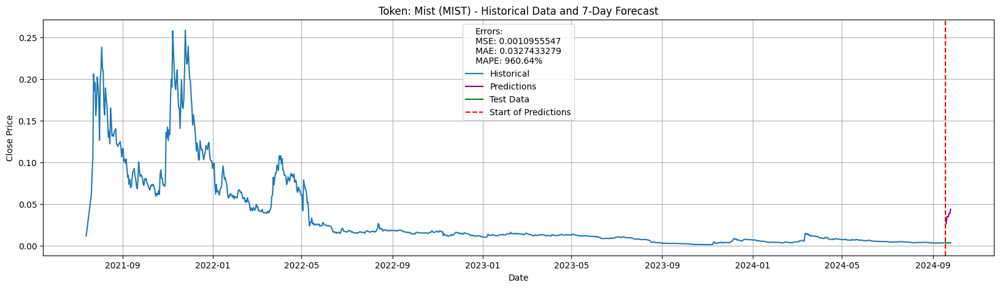

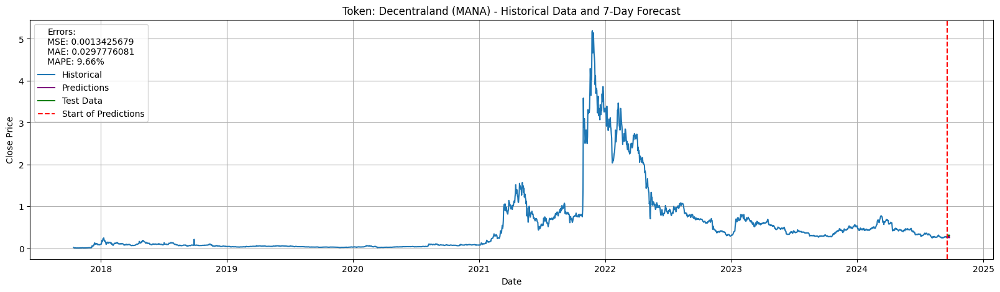

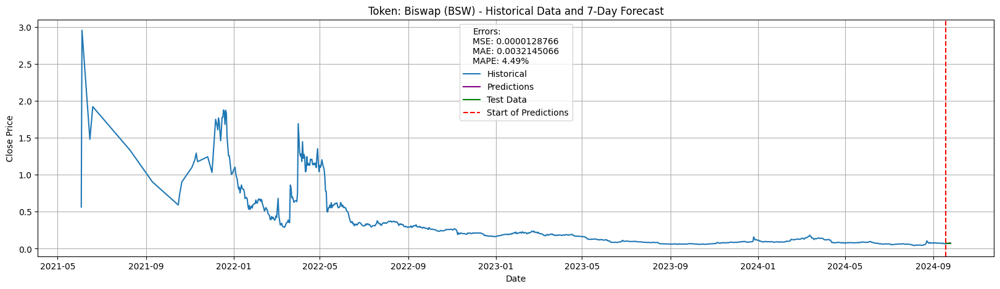

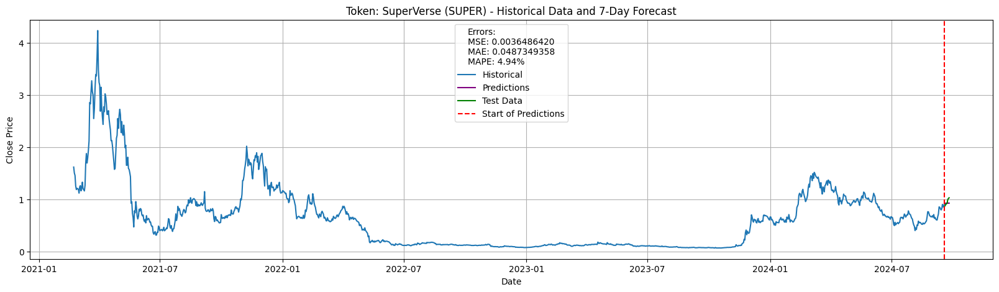

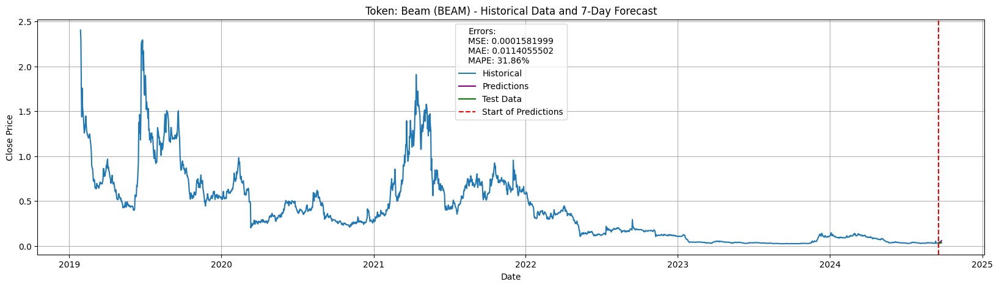

...

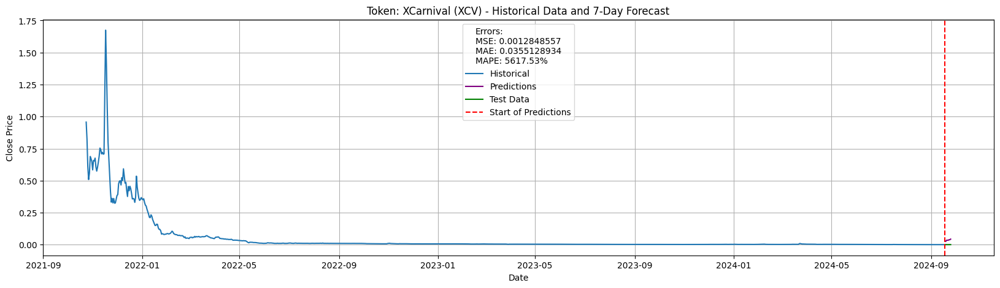

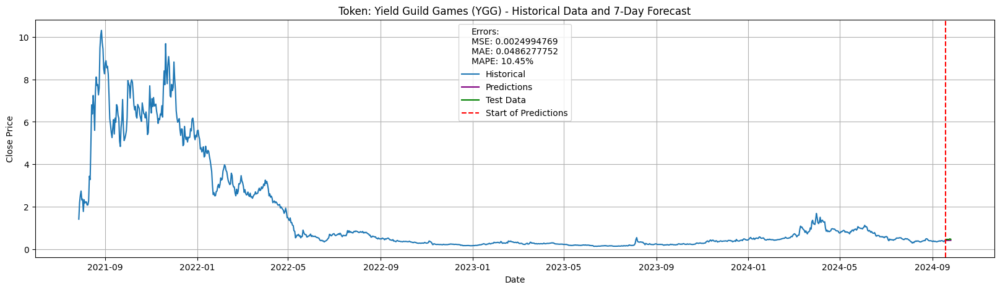

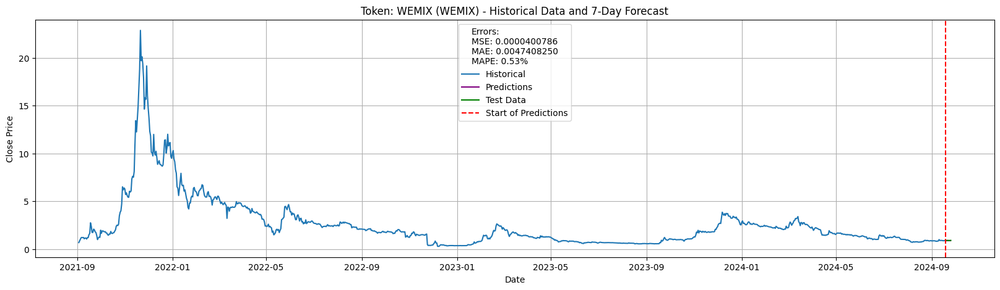

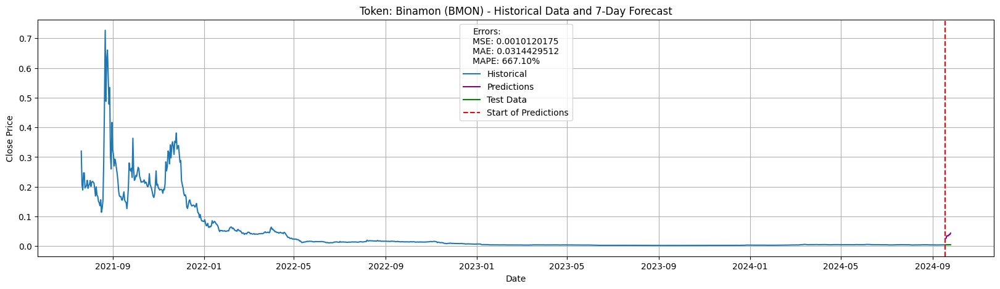

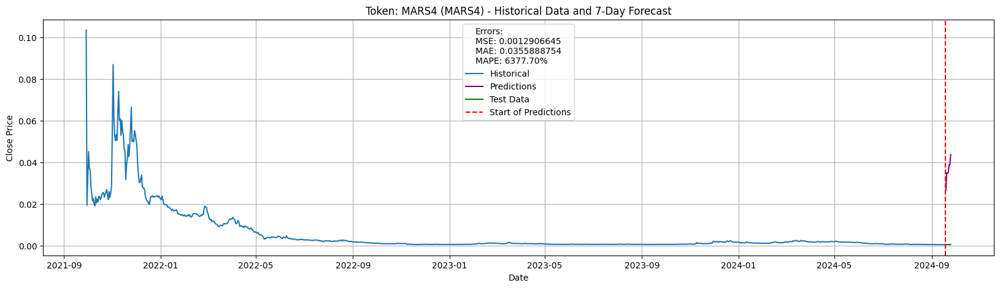

In [10]:
gaming_obj.error_df = u.plot_predictions(train_data=gaming_obj.og_train, predictions_x_days=gaming_obj.og_pred, test_data=gaming_obj.og_test, max_coins=0, last_data_points=-1)

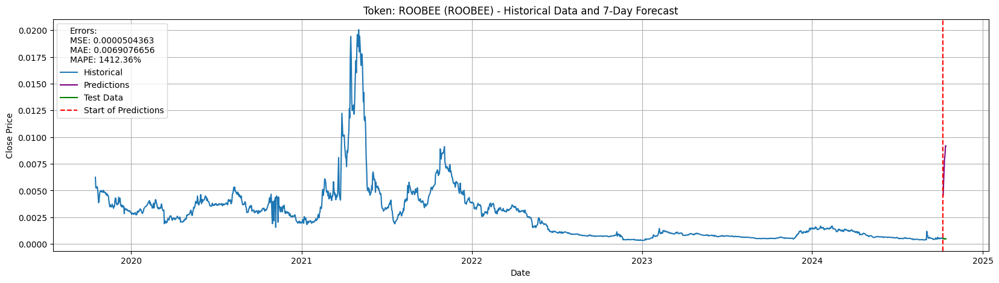

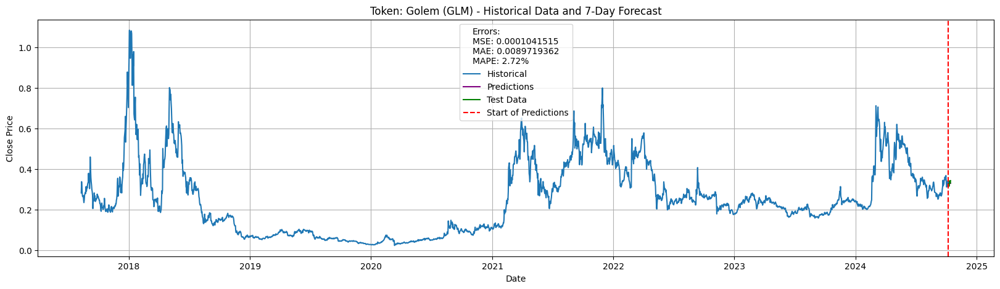

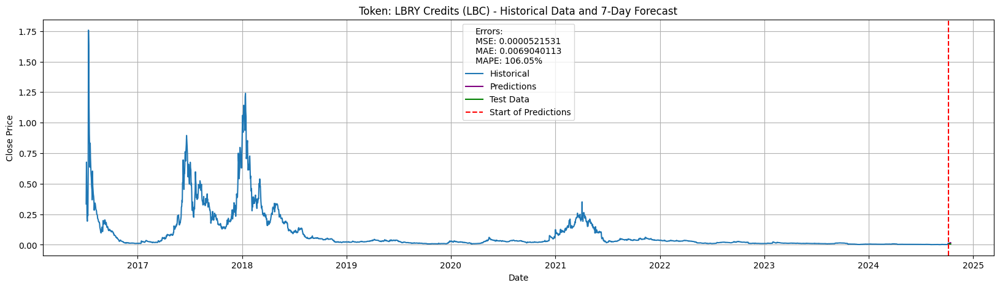

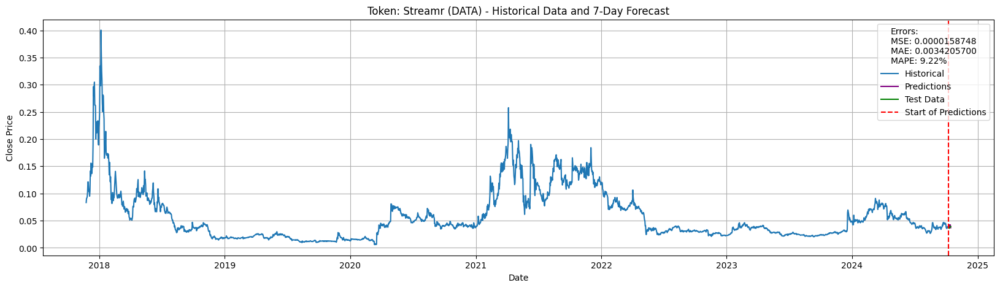

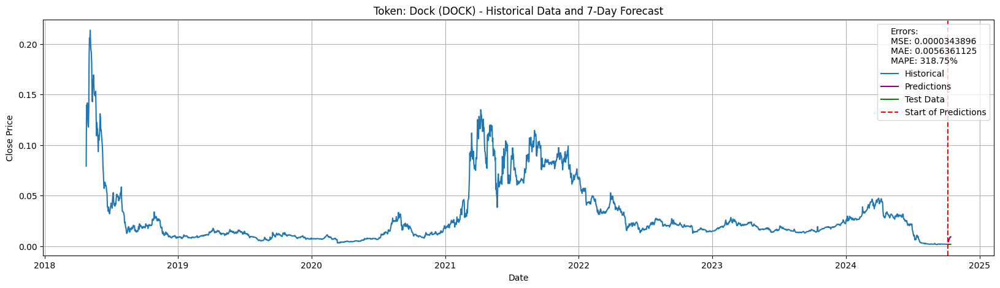

...

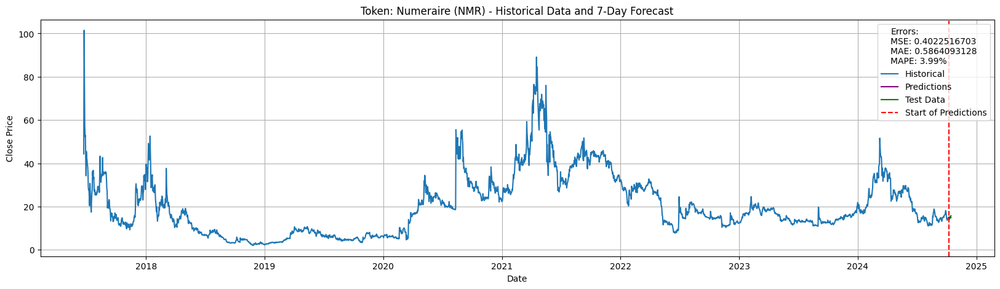

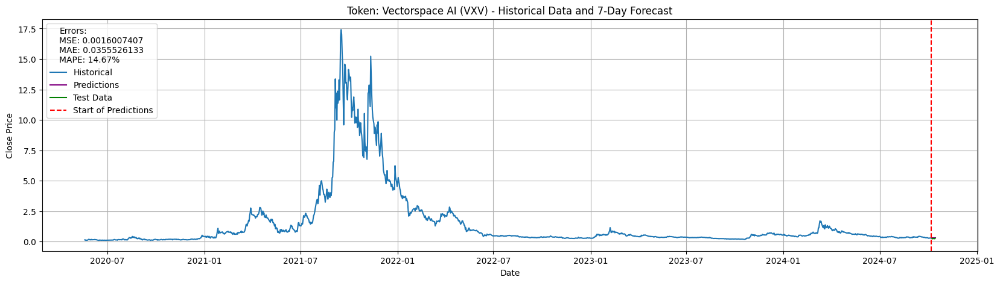

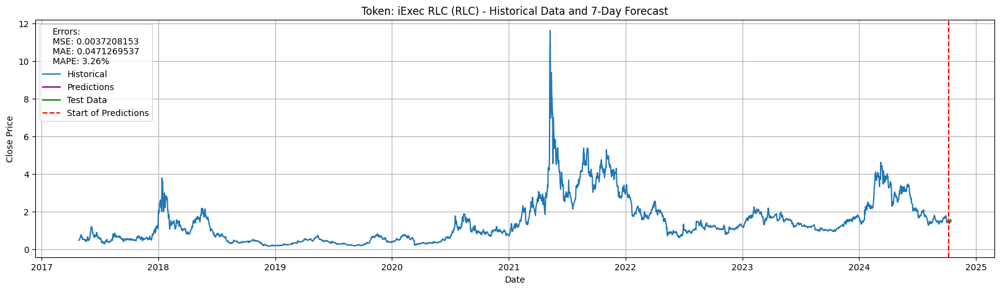

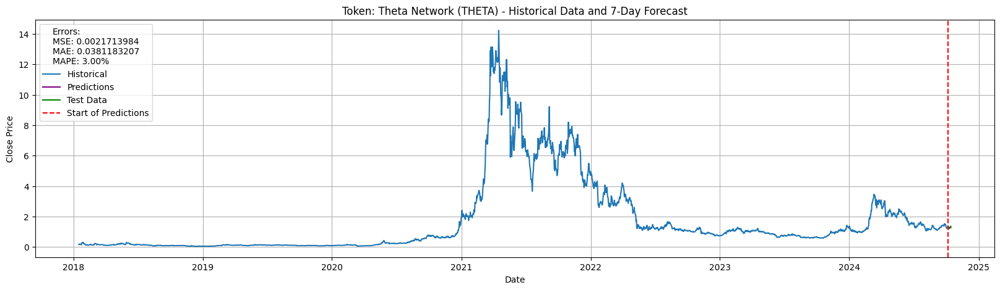

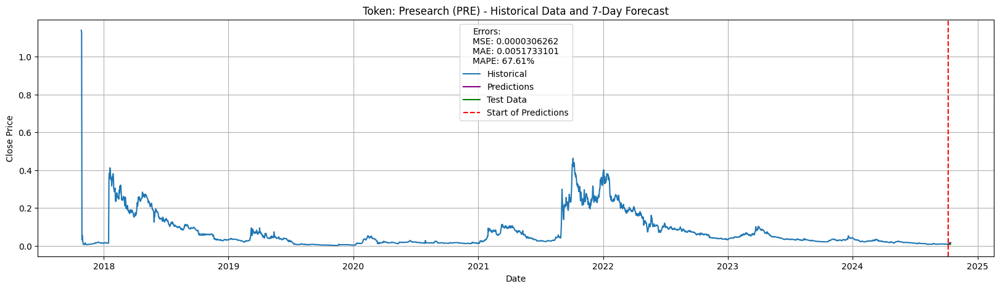

In [11]:
ai_obj.error_df = u.plot_predictions(train_data=ai_obj.og_train, predictions_x_days=ai_obj.og_pred, test_data=ai_obj.og_test, max_coins=0, last_data_points=-1)

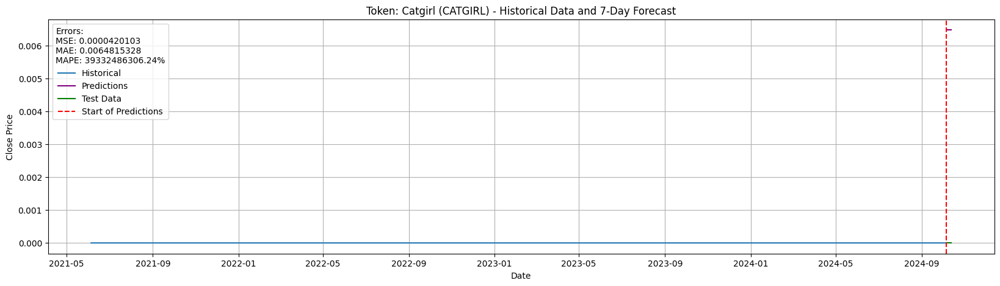

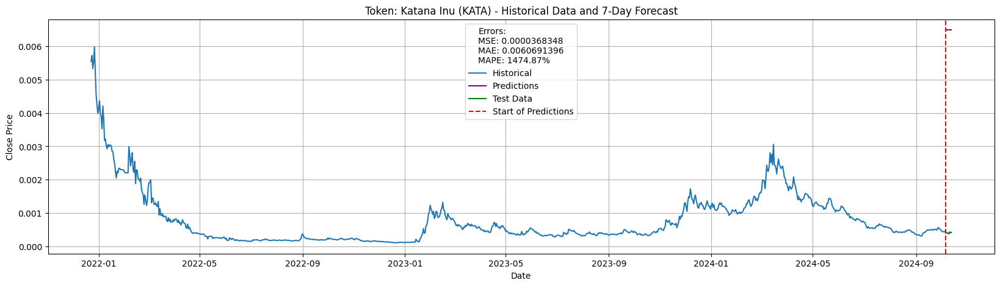

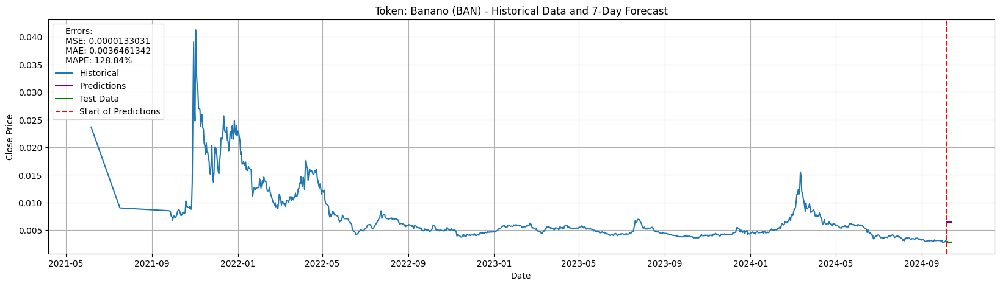

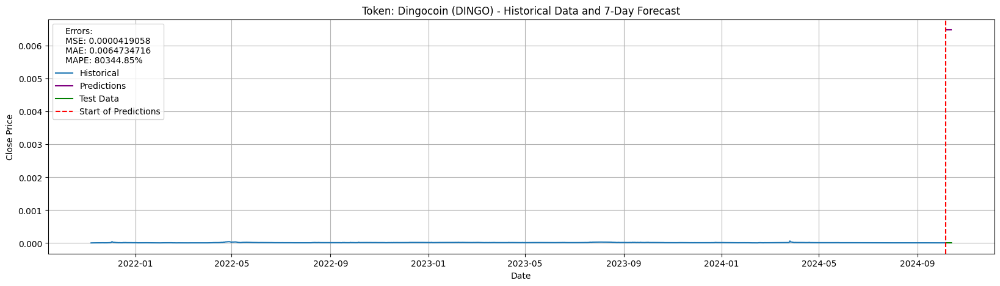

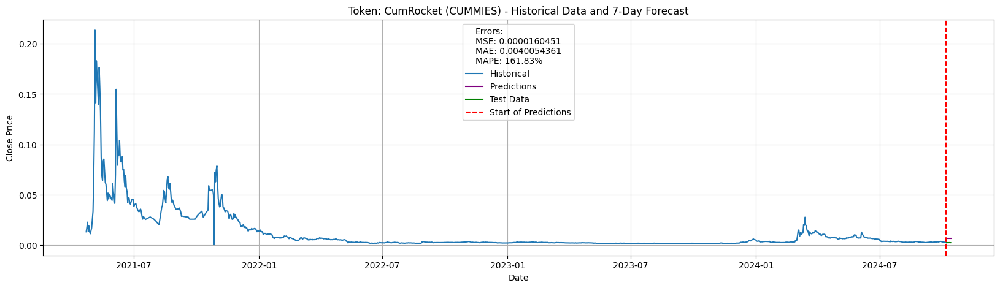

...

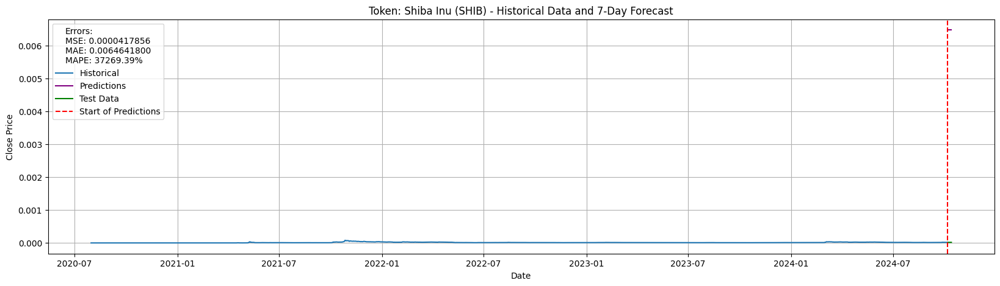

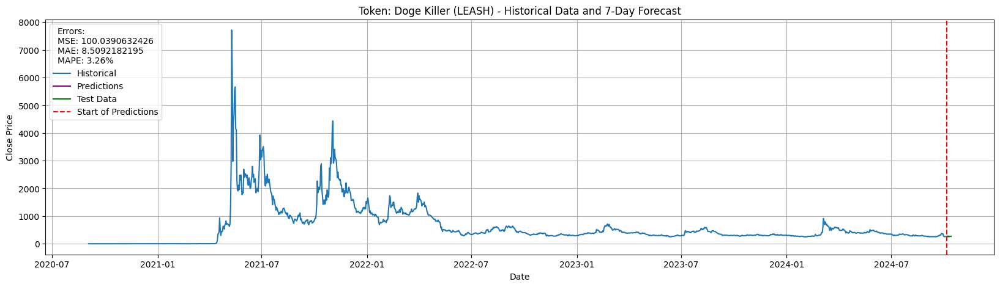

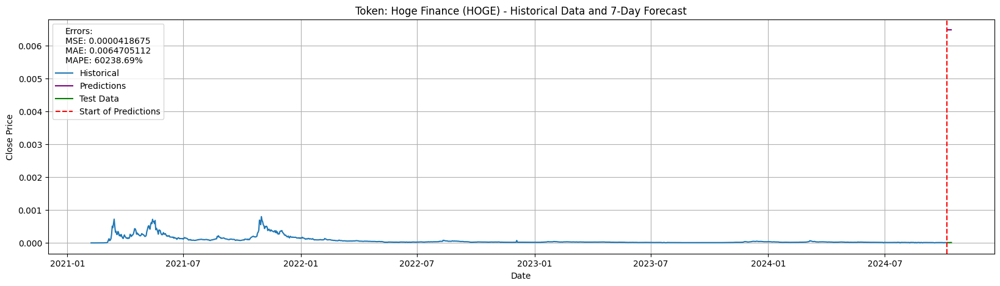

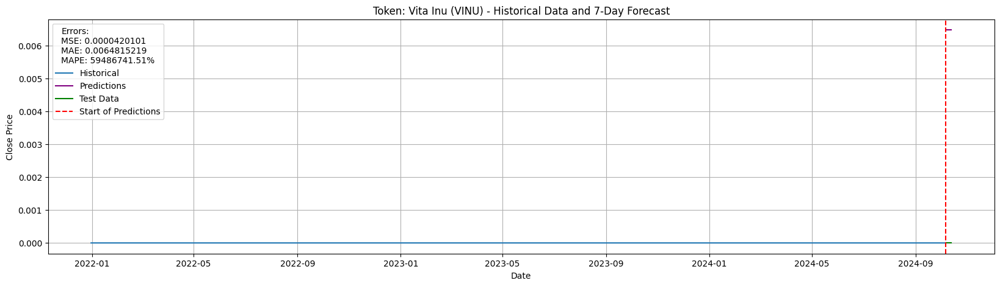

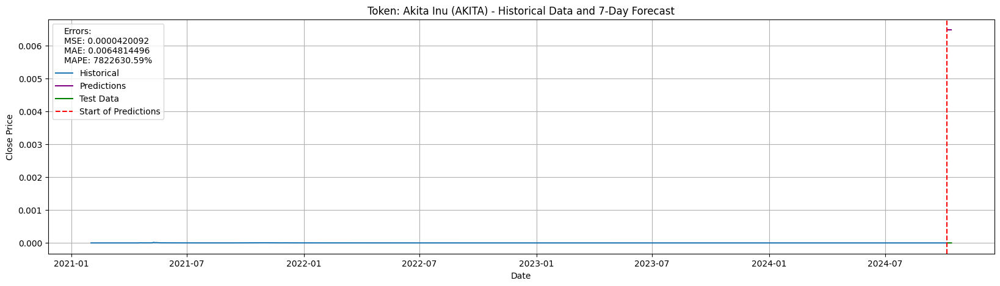

In [12]:
meme_obj.error_df = u.plot_predictions(train_data=meme_obj.og_train, predictions_x_days=meme_obj.og_pred, test_data=meme_obj.og_test, max_coins=0, last_data_points=-1)

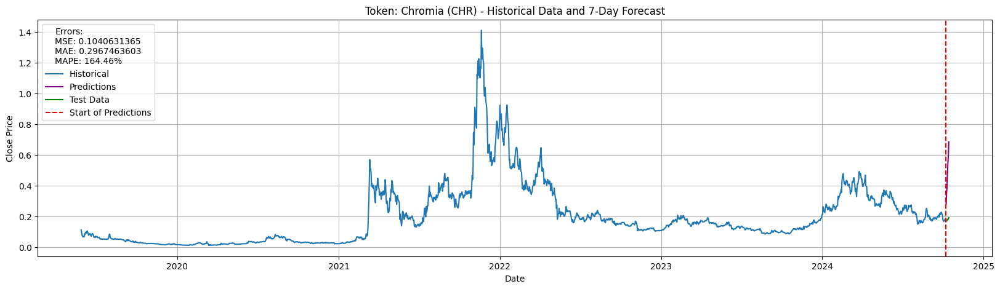

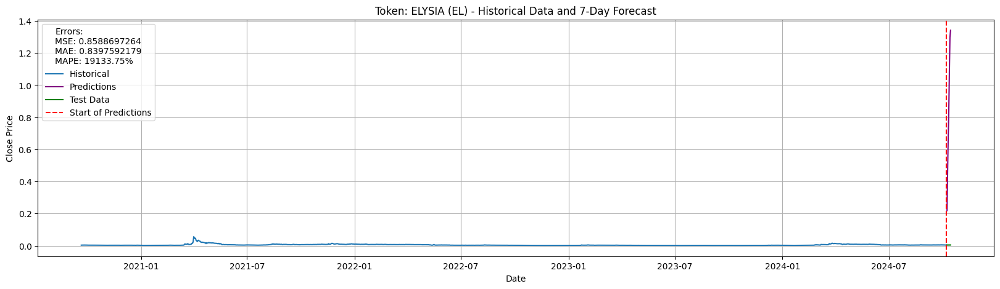

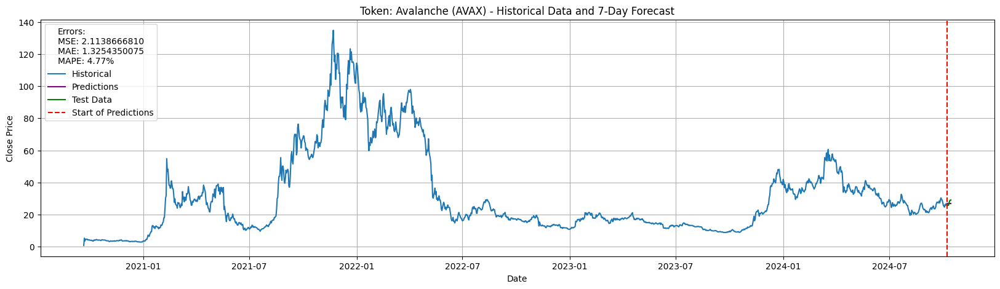

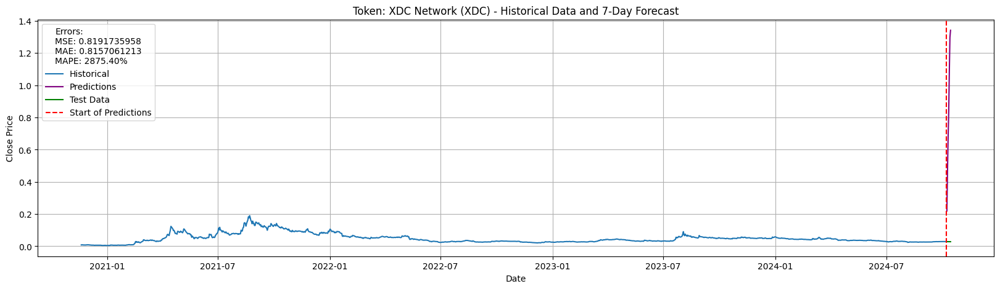

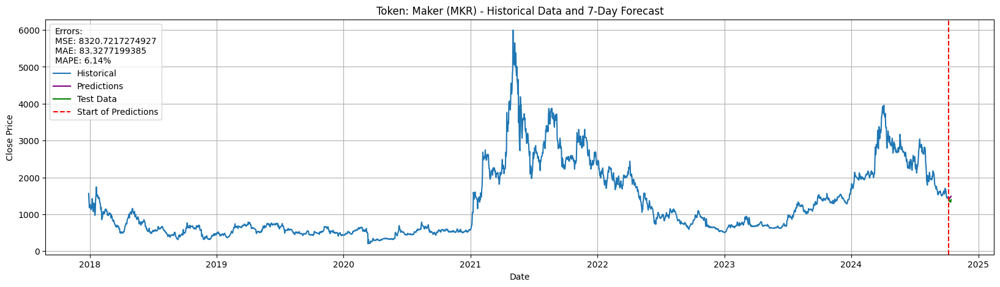

...

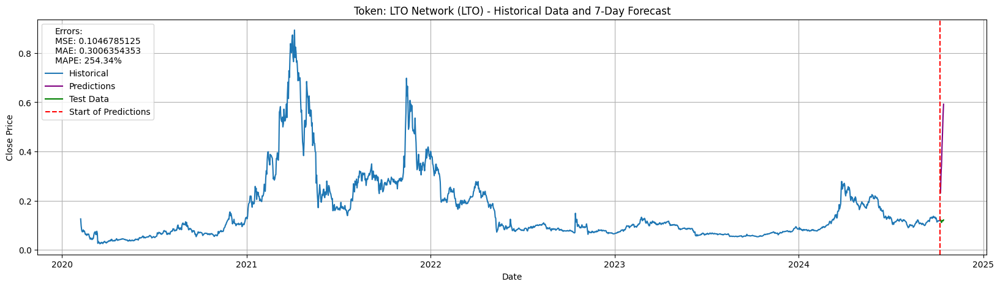

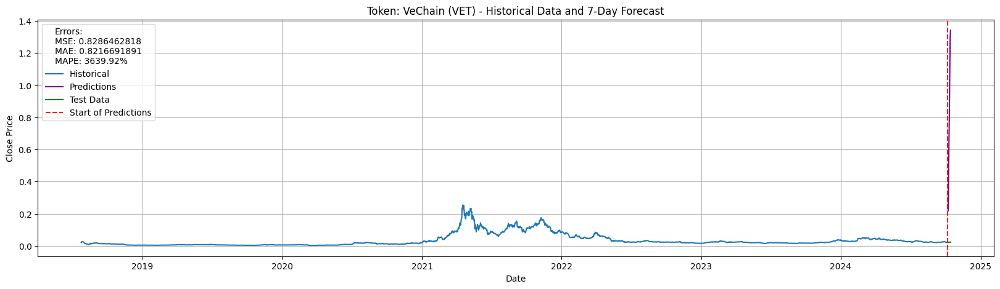

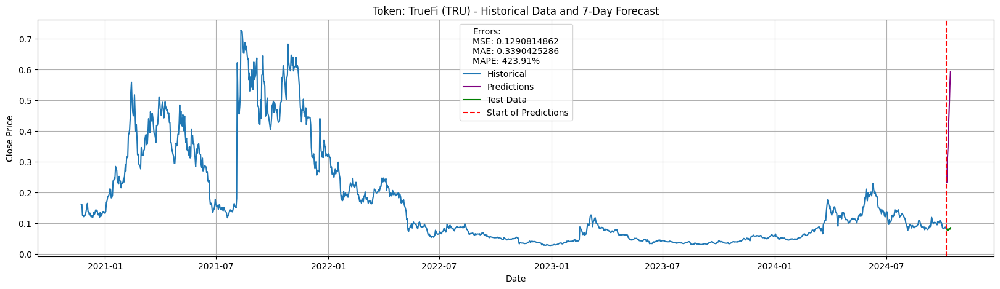

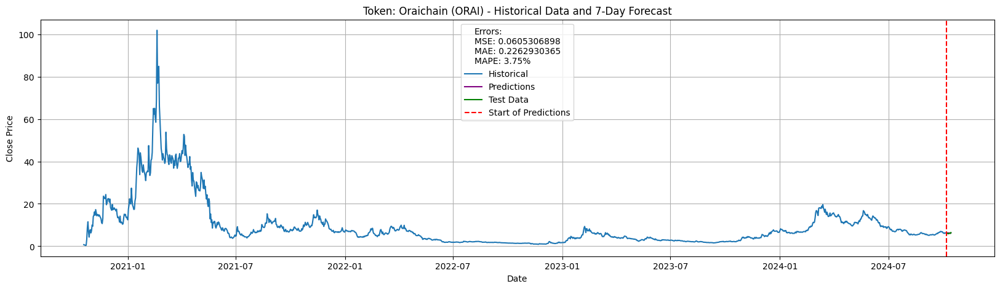

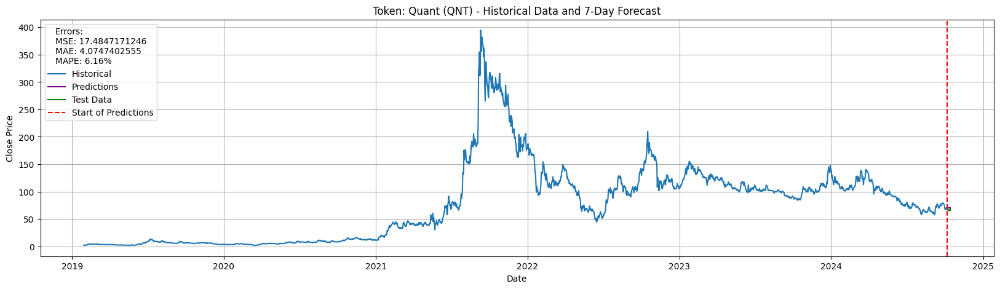

In [13]:
rwa_obj.error_df = u.plot_predictions(train_data=rwa_obj.og_train, predictions_x_days=rwa_obj.og_pred, test_data=rwa_obj.og_test, max_coins=0, last_data_points=-1)